# **SS - 1st Assesment- Online Retail Transaction Analysis**





We examine the dataset related to Online Retail Transaction


ETL Pipeline:  

- Extract: Load data from the provided dataset.  
- Transform: Clean the data, handle missing values, encode categorical variables, and create new features such as total transaction value.  
- Load: Store the transformed data in a format suitable for analysis (e.g., a cleaned DataFrame).  
- Product Analysis: Identify and visualise the most popular products. 

Data Visualisation:  
- Descriptive Statistics: Display basic statistics such as total sales, average transaction value, and number of unique customers.  
- Trend Analysis: Visualise sales trends over time.  
- Customer Segmentation: Segment customers based on purchase behaviour and visualise their characteristics. 

  
# Data Source  

*Fetching data from Kaggle   

In [1]:
import pandas as pd
df = pd.read_csv("/workspace/SS-1st-assestment-Online-Retail-Transaction-Analysis/Online_Retail.csv")
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France


The dataset includes data on the products that were purchased, the quantity of each product, the date and time of each transaction, the price of each product, the unique identifier for each customer who made a purchase, and the country where each customer is located. This dataset can be used to analyze customer behavior and preferences, identify popular products, and optimize pricing and marketing strategies. The dataset is well-suited for data analysis and machine learning applications, as it contains a large volume of transactional data that can be used to train predictive models and make data-driven decisions.

** Column Descriptors  

1-StockCode: A code used to identify the product that was purchased  
2-Description: A brief description of the product that was purchased  
3-Quantity: The quantity of the product that was purchased  
4-InvoiceDate: The date and time that the purchase was made  
5-UnitPrice: The price of one unit of the product that was purchased  
6-CustomerID: The unique identifier for the customer who made the purchase  
7-Country: The country where the customer who made the purchase is located  



## Importing Libraries 

A description was added to the beginning of each code to make it more descriptive. Green text starting with " # "


In [2]:
import numpy as np  # for numerical computations
import pandas as pd # data manipulation and cleaning
import matplotlib.pyplot as plt #visualization in Python
import plotly.express as px # high-level interactive visulations
import plotly.graph_objs as go# creating advanced chart
import seaborn as sns # data visualization
from sklearn.pipeline import Pipeline #visual analysis of statistical data

## ETL Pipeline

---

- ## Descriptive Statistics

- cleaning data set and transform 


In [3]:
df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   541909 non-null  int64  
 7   Country      541909 non-null  object 
dtypes: float64(1), int64(2), object(5)
memory usage: 33.1+ MB


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom


In [4]:
# Checking rows containing negative values
negative_values = df[(df['Quantity'] < 0) | (df['UnitPrice'] < 0)]
print(f"Number of rows containing negative values: {negative_values.shape[0]}")

Number of rows containing negative values: 10626


In [5]:
# Check for missing "Description" data
df_cleaned = df[df['Description'].notna()]

#Convert InvoiceDate to date format
df_cleaned['InvoiceDate'] = pd.to_datetime(df_cleaned['InvoiceDate'], errors='coerce')

#Clearing negative Quantity and UnitPrice values
df_cleaned = df_cleaned[(df_cleaned['Quantity'] > 0) & (df_cleaned['UnitPrice'] > 0)]

# Let's view the cleaned dataset
df_cleaned.info()
df_cleaned.head()

# saving cleaned data set as csv document
df_cleaned.to_csv('df_cleaned.csv', index=False)


/tmp/ipykernel_1655/657616888.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_cleaned['InvoiceDate'] = pd.to_datetime(df_cleaned['InvoiceDate'], errors='coerce')


<class 'pandas.core.frame.DataFrame'>
Int64Index: 530104 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    530104 non-null  object        
 1   StockCode    530104 non-null  object        
 2   Description  530104 non-null  object        
 3   Quantity     530104 non-null  int64         
 4   InvoiceDate  530104 non-null  datetime64[ns]
 5   UnitPrice    530104 non-null  float64       
 6   CustomerID   530104 non-null  int64         
 7   Country      530104 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(4)
memory usage: 36.4+ MB


In [6]:
df_cleaned = df_cleaned[df_cleaned['InvoiceDate'].notna()]
print(df_cleaned[df_cleaned['InvoiceDate'].isna()])

Empty DataFrame
Columns: [InvoiceNo, StockCode, Description, Quantity, InvoiceDate, UnitPrice, CustomerID, Country]
Index: []


In [7]:

#remove any duplicate rows
df_cleaned = df_cleaned.drop_duplicates()

In [8]:
# Checking lines with incorrect dates
invalid_dates = df[df['InvoiceDate'].isna()]
print(f"Hatalı tarih içeren satır sayısı: {invalid_dates.shape[0]}")

Hatalı tarih içeren satır sayısı: 0


In [9]:
# Summary statistics for numeric columns
df_cleaned.describe()

,Quantity,UnitPrice,CustomerID
count,524878.000000,524878.000000,524878.000000
mean,10.616600,3.922573,15287.631345
std,156.280031,36.093028,1482.145530
min,1.000000,0.001000,12346.000000
25%,1.000000,1.250000,14375.000000
50%,4.000000,2.080000,15287.000000
75%,11.000000,4.130000,16245.000000
max,80995.000000,13541.330000,18287.000000


In [10]:
df_cleaned.describe(include=['object'])

,InvoiceNo,StockCode,Description,Country
count,524878,524878,524878,524878
unique,19960,3922,4026,38
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,United Kingdom
freq,1114,2253,2311,479985


In [11]:

# Number of values ​​for categorical columns like "Description" and "Country"
df_cleaned['Country'].value_counts(), df_cleaned['Description'].nunique()

(United Kingdom          479985
 Germany                   9025
 France                    8392
 EIRE                      7879
 Spain                     2479
 Netherlands               2359
 Belgium                   2031
 Switzerland               1958
 Portugal                  1492
 Australia                 1181
 Norway                    1071
 Italy                      758
 Channel Islands            747
 Finland                    685
 Cyprus                     603
 Sweden                     450
 Unspecified                442
 Austria                    398
 Denmark                    380
 Poland                     330
 Japan                      321
 Israel                     292
 Hong Kong                  280
 Singapore                  222
 Iceland                    182
 USA                        179
 Canada                     151
 Greece                     145
 Malta                      112
 United Arab Emirates        68
 European Community          60
 RSA    

- ## Trend Analystics
we will examine which products, countries, or dates sales are concentrated among. This type of analysis can help us understand which products are most popular at certain times and in certain regions.

1. Product-Based Sales Analysis
We will examine which products are selling the most (the highest volume) and generating the most revenue.
2. Country-Based Sales Analysis
We will examine which countries have the most sales and which countries generate the most revenue.
3. Time-Based Sales Analysis
We will examine how sales have changed over time and sales trends over a specific period (for example, monthly or daily).

In [12]:
# Product based sales analysis
df_cleaned['TotalSales'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']

# Find best selling products
top_selling_products = df_cleaned.groupby('Description').agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).sort_values(by='TotalQuantitySold', ascending=False)

# view the top 10 products
top_selling_products.head(10)

,TotalQuantitySold,TotalRevenue
Description,,
"PAPER CRAFT , LITTLE BIRDIE",80995,168469.60
MEDIUM CERAMIC TOP STORAGE JAR,78033,81700.92
WORLD WAR 2 GLIDERS ASSTD DESIGNS,54951,13814.01
JUMBO BAG RED RETROSPOT,48371,94159.81
WHITE HANGING HEART T-LIGHT HOLDER,37872,106236.72
POPCORN HOLDER,36749,34288.67
PACK OF 72 RETROSPOT CAKE CASES,36396,21246.45
ASSORTED COLOUR BIRD ORNAMENT,36362,58927.62
RABBIT NIGHT LIGHT,30739,66870.03


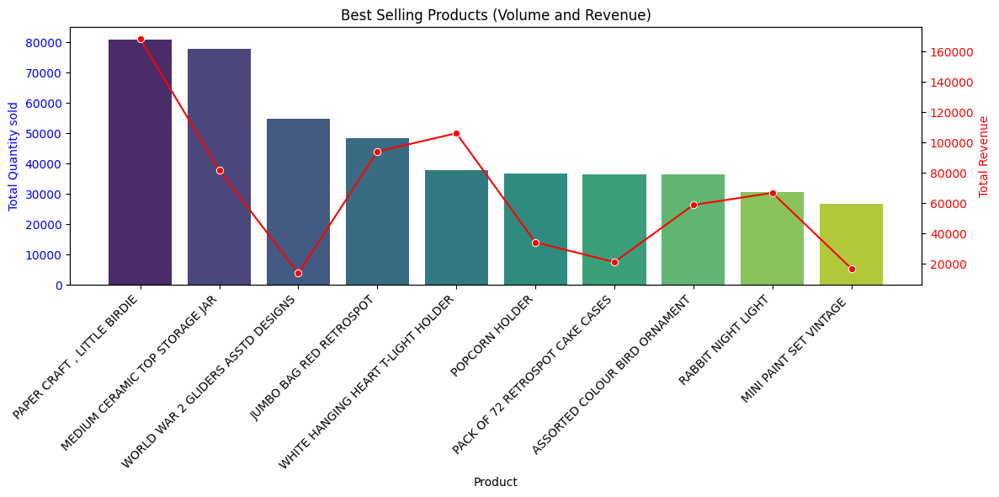

In [13]:
# add 'TotalSales' column
df_cleaned['TotalSales'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']

# Calculating total sales amount and total revenue on a product basis
top_selling_products = df_cleaned.groupby('Description').agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).sort_values(by='TotalQuantitySold', ascending=False)

# find top 10
top_10_products = top_selling_products.head(10)

# see top 10
top_10_products

fig, ax1 = plt.subplots(figsize=(12, 6))

# First axis: Total Quantity Sold
sns.barplot(data=top_10_products, x=top_10_products.index, y='TotalQuantitySold', palette='viridis', ax=ax1)
ax1.set_xlabel('Product')
ax1.set_ylabel('Total Quantity sold', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticklabels(top_10_products.index, rotation=45, ha='right')

# Second axis: Total Revenue
ax2 = ax1.twinx()
sns.lineplot(data=top_10_products, x=top_10_products.index, y='TotalRevenue', color='r', marker='o', ax=ax2)
ax2.set_ylabel('Total Revenue', color='r')
ax2.tick_params(axis='y', labelcolor='r')

plt.title('Best Selling Products (Volume and Revenue)')
plt.tight_layout()
plt.show()

In [14]:
# Country based sales analysis
sales_by_country = df_cleaned.groupby('Country').agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).sort_values(by='TotalRevenue', ascending=False)

sales_by_country.head(10) 

,TotalQuantitySold,TotalRevenue
Country,,
United Kingdom,4646906,9001744.094
Netherlands,200361,285446.340
EIRE,147007,283140.520
Germany,119154,228678.400
France,112060,209625.370
Australia,83891,138453.810
Spain,27933,61558.560
Switzerland,30617,57067.600
Belgium,23237,41196.340


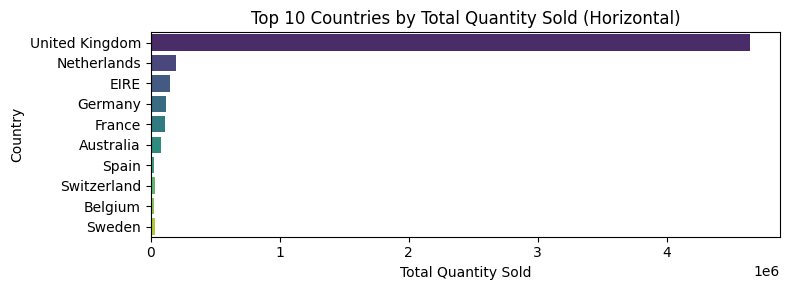

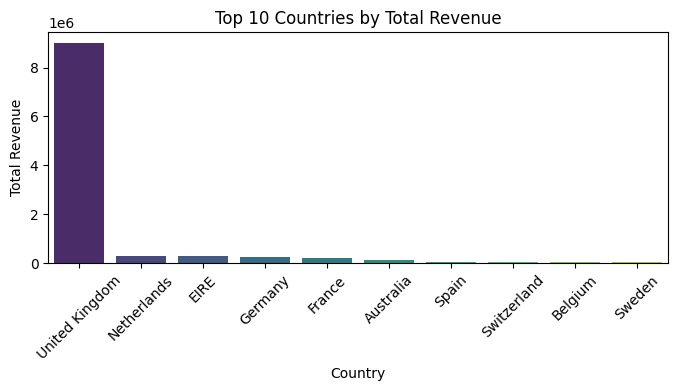

In [15]:

# Sorting the data to get the top 10 countries
top_10_countries = sales_by_country.head(10)

# Visualize total sales amount
plt.figure(figsize=(8, 3))
sns.barplot(x=top_10_countries['TotalQuantitySold'], y=top_10_countries.index, palette='viridis')
plt.title('Top 10 Countries by Total Quantity Sold (Horizontal)')
plt.xlabel('Total Quantity Sold')
plt.ylabel('Country')
plt.tight_layout()
plt.show()

# Total income chart
plt.figure(figsize=(8, 3))
sns.barplot(x=top_10_countries.index, y=top_10_countries['TotalRevenue'], palette='viridis')
plt.title('Top 10 Countries by Total Revenue')
plt.xlabel('Country')
plt.ylabel('Total Revenue')
plt.xticks(rotation=45)
plt.show()



In [16]:
# Sales analysis by time (daily)
df_cleaned['InvoiceDate'] = pd.to_datetime(df_cleaned['InvoiceDate'])  # Zaten tarih türünde olmalı
sales_by_date = df_cleaned.groupby(df_cleaned['InvoiceDate'].dt.date).agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).sort_index()

# first 10 day
sales_by_date.head(10)

,TotalQuantitySold,TotalRevenue
InvoiceDate,,
2010-12-01,26818,58776.79
2010-12-02,31264,47629.42
2010-12-03,16158,46898.63
2010-12-05,16242,31364.63
2010-12-06,21619,54624.15
2010-12-07,25180,99553.85
2010-12-08,23041,45235.36
2010-12-09,19898,53548.19
2010-12-10,20973,59021.02


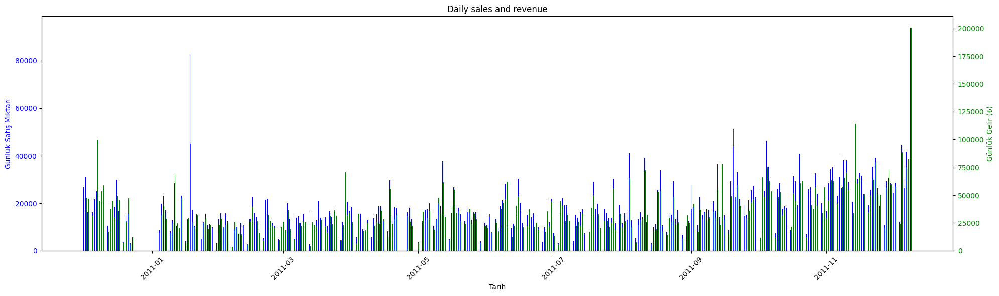

In [17]:
# Generating daily sales data (via InvoiceDate)
df_cleaned['InvoiceDate'] = pd.to_datetime(df_cleaned['InvoiceDate'], errors='coerce')  # Tarih formatına çevirme
df_cleaned['TotalSales'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']  # Toplam satış

#Grouping daily sales and daily revenue
daily_sales = df_cleaned.groupby(df_cleaned['InvoiceDate'].dt.date)['Quantity'].sum()
daily_revenue = df_cleaned.groupby(df_cleaned['InvoiceDate'].dt.date)['TotalSales'].sum()

# checking first lines
daily_sales.head(), daily_revenue.head()

## Creating a dual axis bar chart
fig, ax1 = plt.subplots(figsize=(20,6))

# First axis: Plotting daily sales amount with bar chart
ax1.bar(daily_sales.index, daily_sales.values, width=0.4, color='b', label='Günlük Satış Miktarı', align='center')
ax1.set_xlabel('Tarih')
ax1.set_ylabel('Günlük Satış Miktarı', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticks(daily_sales.index[::7])  # Haftada bir x-tik koyarak daha temiz görünmesini sağlamak
ax1.set_xticklabels(daily_sales.index[::7], rotation=45)

# Second axis: Plotting daily income with a bar chart
ax2 = ax1.twinx()
ax2.bar(daily_revenue.index, daily_revenue.values, width=0.4, color='g', label='Günlük Gelir', align='edge')
ax2.set_ylabel('Günlük Gelir (₺)', color='g')
ax2.tick_params(axis='y', labelcolor='g')

plt.title('Daily sales and revenue')
fig.tight_layout()  # Make the layout more organized by compressing it
plt.show()


In [18]:
# Monthly Sales
sales_by_month = df_cleaned.groupby(df_cleaned['InvoiceDate'].dt.to_period('M')).agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).sort_index()

sales_by_month.head(5)

,TotalQuantitySold,TotalRevenue
InvoiceDate,,
2010-12,358019,821452.730
2011-01,387099,689811.610
2011-02,282934,522545.560
2011-03,376599,716215.260
2011-04,307953,536968.491


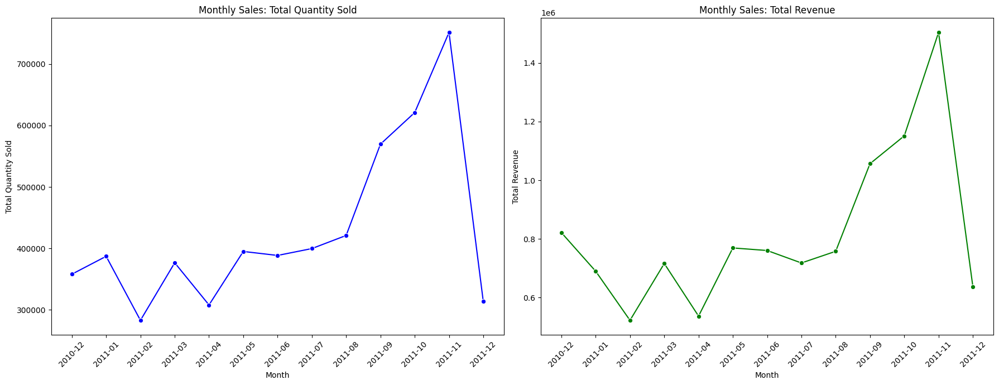

In [19]:

# Using monthly sales and revenue data, we will display two graphs side by side in the same figure.

# Graphic dimensions and layout
fig, axes = plt.subplots(1, 2, figsize=(18, 7))  

# Montly Sales
sns.lineplot(data=sales_by_month, x=sales_by_month.index.astype(str), y='TotalQuantitySold', marker='o', color='b', ax=axes[0])
axes[0].set_title('Monthly Sales: Total Quantity Sold')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Total Quantity Sold')
axes[0].tick_params(axis='x', rotation=45)

# Montly Revenue
sns.lineplot(data=sales_by_month, x=sales_by_month.index.astype(str), y='TotalRevenue', marker='o', color='g', ax=axes[1])
axes[1].set_title('Monthly Sales: Total Revenue')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Total Revenue')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


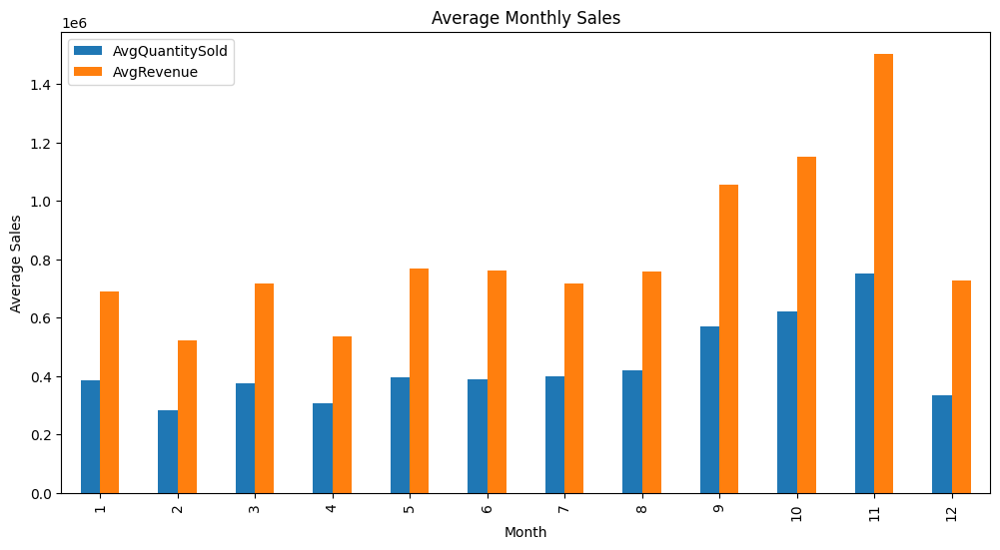

In [20]:
# avarage monthly sales
monthly_avg_sales = sales_by_month.groupby(sales_by_month.index.month).agg(
    AvgQuantitySold=('TotalQuantitySold', 'mean'),
    AvgRevenue=('TotalRevenue', 'mean')
)

monthly_avg_sales.plot(kind='bar', figsize=(12,6), title='Average Monthly Sales')
plt.ylabel('Average Sales')
plt.xlabel('Month')
plt.show()

In [21]:

# Create the 'Year' column (To group by year)
df_cleaned['Year'] = df_cleaned['InvoiceDate'].dt.year

#  'TotalSales'  (Quantity * UnitPrice)
df_cleaned['TotalSales'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']

# Grouping annual total sales by Product and Country
sales_by_year_product_country = df_cleaned.groupby(['Year', 'Description', 'Country']).agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).reset_index()

sales_by_year_product_country.head()


,Year,Description,Country,TotalQuantitySold,TotalRevenue
0,2010,4 PURPLE FLOCK DINNER CANDLES,United Kingdom,16,45.82
1,2010,OVAL WALL MIRROR DIAMANTE,United Kingdom,22,283.03
2,2010,SET 2 TEA TOWELS I LOVE LONDON,France,24,70.80
3,2010,SET 2 TEA TOWELS I LOVE LONDON,United Kingdom,282,936.14
4,2010,*Boombox Ipod Classic,United Kingdom,1,16.98


In [22]:

# InvoiceDate'yi 'Yıl-Ay' formatında dönüştürme
df_cleaned['Month'] = df_cleaned['InvoiceDate'].dt.to_period('M')

# Aylık toplam satışları ürün ve ülke bazında gruplama
monthly_sales = df_cleaned.groupby(['Month', 'Country', 'Description'])['Quantity'].sum().reset_index()

# Verinin ilk birkaç satırını kontrol edelim
monthly_sales.head()

,Month,Country,Description,Quantity
0,2010-12,Australia,20 DOLLY PEGS RETROSPOT,24
1,2010-12,Australia,ALARM CLOCK BAKELIKE GREEN,4
2,2010-12,Australia,ALARM CLOCK BAKELIKE PINK,4
3,2010-12,Australia,ALARM CLOCK BAKELIKE RED,4
4,2010-12,Australia,ASSORTED BOTTLE TOP MAGNETS,120


In [23]:
import plotly.express as px

# Sort the data by Quantity sold and select top 10
top_10_monthly_sales = monthly_sales.sort_values(by='Quantity', ascending=False).head(10)

# Create the bar plot using Plotly Express
fig = px.bar(top_10_monthly_sales,
             x='Quantity', 
             y='Description',
             color='Country', 
             hover_data=['Quantity', 'Country'],
             title='Top 10 Monthly Sales by Product and Country',
             labels={'Quantity': 'Quantity Sold', 'Description': 'Product Description'},
             color_continuous_scale='Viridis',  # Vibrant color scale
             text='Quantity'  # Display quantity on bars
            )

# Customize the layout for better aesthetics
fig.update_layout(
    title={'x': 0.5, 'xanchor': 'center', 'y': 0.95, 'font': {'size': 18, 'family': 'Arial', 'color': 'black'}},
    xaxis_title='Quantity Sold',
    yaxis_title='Product Description',
    yaxis={'categoryorder': 'total ascending'},  # Sort y-axis based on quantity sold
    plot_bgcolor='white',  # Background color
    showlegend=True
)

# Customize the bar text annotations to display on the bars
fig.update_traces(textposition='outside', textfont=dict(size=12, color='black'))

# Show the interactive plot
fig.show()


In [24]:
import plotly.express as px

# Example: Mapping total sales by country
# Calculate total sales by country (using 'TotalSales' column created earlier)
sales_by_country = df_cleaned.groupby('Country')['TotalSales'].sum().reset_index()

# You can use Plotly's built-in country codes or use a custom map (like ISO3 country codes)
# You may want to merge with latitude/longitude data for more granular control

# Create the map plot using Plotly Express
fig = px.choropleth(sales_by_country,
                    locations='Country',
                    locationmode='country names',  # Use country names for mapping
                    color='TotalSales',
                    hover_name='Country',
                    color_continuous_scale='Viridis',
                    labels={'TotalSales': 'Total Sales'},
                    title='Total Sales by Country')

# Set Mapbox style and zoom level for a better view
fig.update_geos(projection_type="natural earth",
               showland=True,
               landcolor="white",
               countrycolor="lightgray")

# Add Mapbox style (you need your own Mapbox Access Token here)
fig.update_layout(mapbox_style="carto-positron",
                  mapbox_accesstoken='YOUR_MAPBOX_ACCESS_TOKEN')



- ## Customer Segmentation: 
Segment customers based on purchase behaviour and visualise their characteristics.



Customer segmentation helps to understand the development of each segment and make decisions by dividing a relationship's customer base into specific groups. Customer segmentation by purchase is usually done based on customers' spending, frequency of purchase, and types of products available for purchase.

The RFM (Recency, Frequency, Monetary) model. This model classifies customers according to three criteria:

Recency: How active has the customer been recently? That is, when did they last shop?
Frequency: How often does the customer shop?
Monetary: How much did the customer spend in total?

In [25]:
#Recency: Calculating how long it has been since the last purchase.
# Last shopping date
current_date = df_cleaned['InvoiceDate'].max()

# Recency (number of days since last purchase)
df_cleaned['Recency'] = (current_date - df_cleaned['InvoiceDate']).dt.days

In [26]:
# Frequency: How often the customer makes purchases.
frequency = df_cleaned.groupby('CustomerID')['InvoiceNo'].nunique()
frequency.name = 'Frequency'

In [27]:
#Monetary: The total spend of each customer.
df_cleaned['TotalSales'] = df_cleaned['Quantity'] * df_cleaned['UnitPrice']
monetary = df_cleaned.groupby('CustomerID')['TotalSales'].sum()
monetary.name = 'Monetary'

In [28]:
# merge RFM values
rfm = pd.concat([frequency, monetary], axis=1)
rfm['Recency'] = df_cleaned.groupby('CustomerID')['Recency'].min()
rfm = rfm.reset_index()

In [29]:
# Segments for frequency (2 thousand)
rfm['Frequency_Score'] = pd.qcut(rfm['Frequency'], 2, labels=[1, 2], duplicates='drop')

#Segments for Monetary (2 thousand)
rfm['Monetary_Score'] = pd.qcut(rfm['Monetary'], 2, labels=[1, 2], duplicates='drop')

# Segments for  Recency (2 thousand)
rfm['Recency_Score'] = pd.qcut(rfm['Recency'], 2, labels=[2, 1], duplicates='drop')

# Total RFM Score
rfm['RFM_Score'] = rfm['Recency_Score'].astype(str) + rfm['Frequency_Score'].astype(str) + rfm['Monetary_Score'].astype(str)

print(rfm)

      CustomerID  Frequency  Monetary  Recency Frequency_Score Monetary_Score  \
0          12346          1  77183.60      325               1              2   
1          12347          7   4310.00        1               2              2   
2          12348          4   1797.24       74               2              2   
3          12349          1   1757.55       18               1              2   
4          12350          1    334.40      309               1              1   
...          ...        ...       ...      ...             ...            ...   
4333       18280          1    180.60      277               1              1   
4334       18281          1     80.82      180               1              1   
4335       18282          2    178.05        7               1              1   
4336       18283         16   2045.53        3               2              2   
4337       18287          3   1837.28       42               2              2   

     Recency_Score RFM_Scor

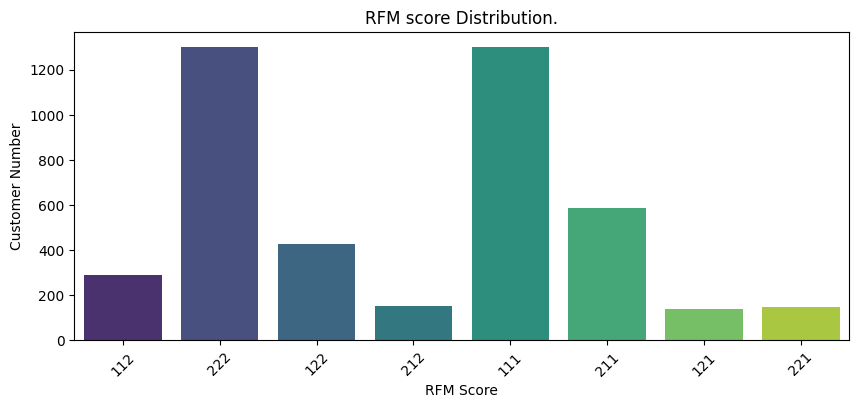

In [30]:

# RFM score distribution
plt.figure(figsize=(10, 4))
sns.countplot(x='RFM_Score', data=rfm, palette='viridis')
plt.title('RFM score Distribution.')
plt.xlabel('RFM Score')
plt.ylabel('Customer Number')
plt.xticks(rotation=45)
plt.show()

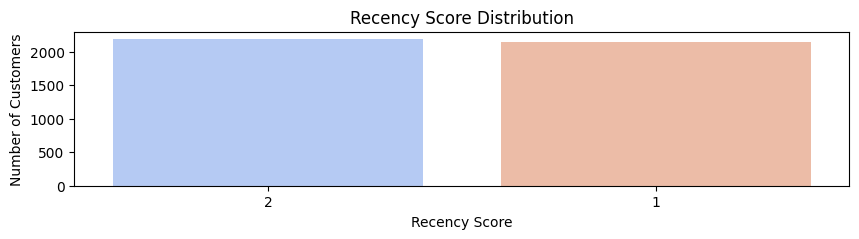

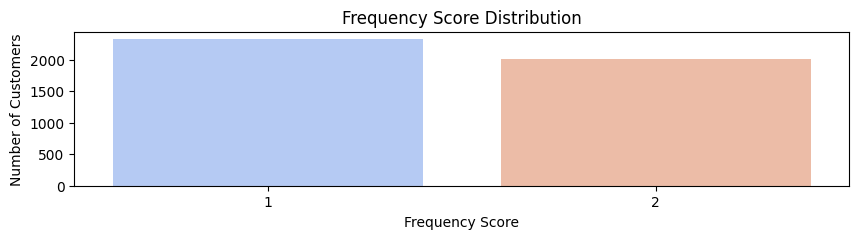

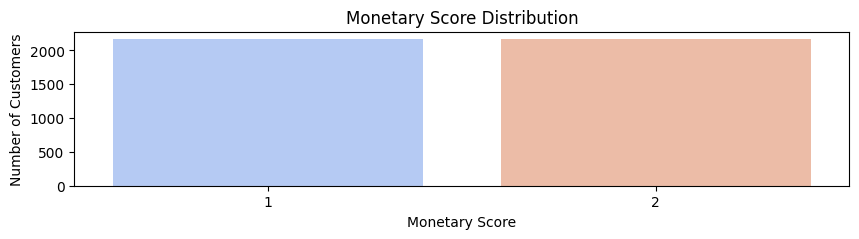

In [31]:
# Recency Score Distribution
plt.figure(figsize=(10, 2))
sns.countplot(x='Recency_Score', data=rfm, palette='coolwarm')
plt.title('Recency Score Distribution')
plt.xlabel('Recency Score')
plt.ylabel('Number of Customers')
plt.show()

# Frequency Score Distribution
plt.figure(figsize=(10, 2))
sns.countplot(x='Frequency_Score', data=rfm, palette='coolwarm')
plt.title('Frequency Score Distribution')
plt.xlabel('Frequency Score')
plt.ylabel('Number of Customers')
plt.show()

# Monetary Score Distribution
plt.figure(figsize=(10, 2))
sns.countplot(x='Monetary_Score', data=rfm, palette='coolwarm')
plt.title('Monetary Score Distribution')
plt.xlabel('Monetary Score')
plt.ylabel('Number of Customers')
plt.show()


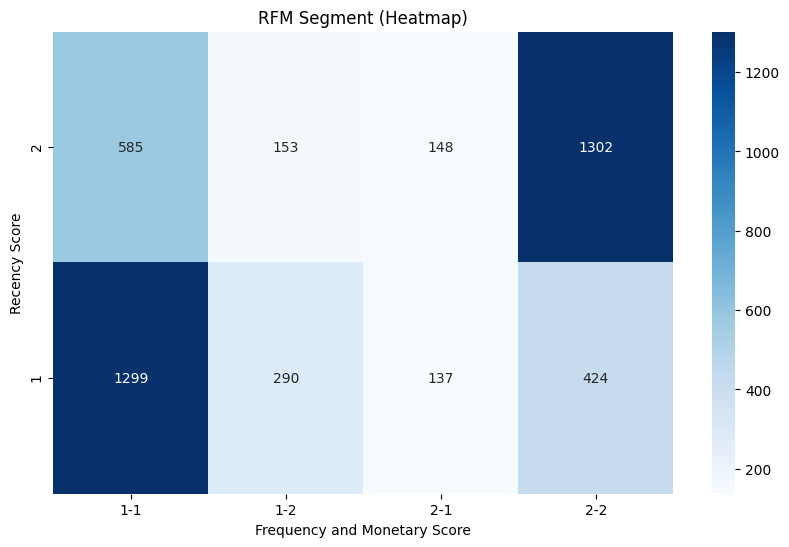

In [32]:
# Clustering of RFM segments
rfm_combined = rfm.groupby(['Recency_Score', 'Frequency_Score', 'Monetary_Score']).size().reset_index(name='Customer Count')

# Preparing data for heatmap
rfm_pivot = rfm_combined.pivot_table(index='Recency_Score', columns=['Frequency_Score', 'Monetary_Score'], values='Customer Count', fill_value=0)

plt.figure(figsize=(10, 6))
sns.heatmap(rfm_pivot, annot=True, cmap="Blues", fmt='d')
plt.title('RFM Segment (Heatmap)')
plt.ylabel('Recency Score')
plt.xlabel('Frequency and Monetary Score')
plt.show()


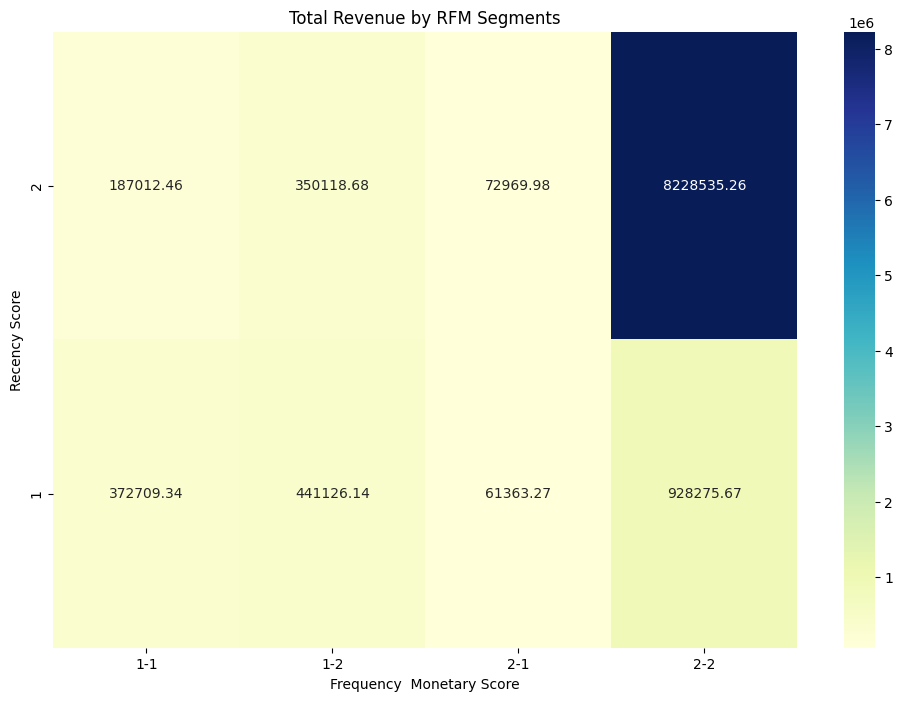

In [33]:
# Total revenue by segment
segment_revenue = rfm.groupby(['Recency_Score', 'Frequency_Score', 'Monetary_Score']).agg(
    TotalRevenue=('Monetary', 'sum')
).reset_index()

# Revenue visualization by segments
plt.figure(figsize=(12, 8))
sns.heatmap(segment_revenue.pivot_table(index='Recency_Score', columns=['Frequency_Score', 'Monetary_Score'], values='TotalRevenue', fill_value=0),
            annot=True, cmap="YlGnBu", fmt='.2f')
plt.title('Total Revenue by RFM Segments')
plt.ylabel('Recency Score')
plt.xlabel('Frequency  Monetary Score')
plt.show()

In [34]:
import plotly.express as px

# Let's calculate sales totals by product
product_sales = df_cleaned.groupby('Description').agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).reset_index()

# Tree Map 
fig = px.treemap(product_sales,
                  path=['Description'],  
                  values='TotalRevenue',  
                  color='TotalQuantitySold',  
                  hover_data=['TotalRevenue', 'TotalQuantitySold'],  
                  title='Tree Map: sales totals by product')
fig.show()


/workspace/.pip-modules/lib/python3.9/site-packages/plotly/express/_core.py:1575: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [35]:
import plotly.express as px

# calculate total sales by Country and Product
sales_by_country_product = df_cleaned.groupby(['Country', 'Description']).agg(
    TotalQuantitySold=('Quantity', 'sum'),
    TotalRevenue=('TotalSales', 'sum')
).reset_index()

fig = px.sunburst(sales_by_country_product,
                  path=['Country', 'Description'],  
                  values='TotalRevenue', 
                  color='TotalQuantitySold',  
                  hover_data=['TotalQuantitySold', 'TotalRevenue'],  
                  title='Sunburst: total sales by Country and Product')


fig.show()


/workspace/.pip-modules/lib/python3.9/site-packages/plotly/express/_core.py:1575: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/workspace/.pip-modules/lib/python3.9/site-packages/plotly/express/_core.py:1575: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



## summary
With the data in your dataset,
Total Sales Quantity and Value were calculated and visualized
A general summary was included and seen by calculating total sales quantities and total sales value (Quantity * UnitPrice).

It was determined which was purchased the most
Sales were examined on a country basis and which countries had the highest income
Monthly, daily time periods were examined.
customer-based analysis was performed.  

## Conclusion:

Online retail transaction analysis offers valuable insights that help businesses improve performance and optimize strategies. Key areas of focus include:

Sales Performance: Analyzing total sales, revenue distribution, and best-selling products helps identify trends and seasonal patterns.  

Customer Behavior: Understanding customer segmentation, purchase frequency, and cart abandonment rates provides insights into customer preferences and shopping habits.  

Marketing Effectiveness: Evaluating the performance of various marketing channels, ROI, and the impact of promotions helps refine marketing strategies.  

Customer Loyalty: Tracking new customer acquisition, repeat purchases, and customer lifetime value allows businesses to enhance retention and loyalty.   

Product and Inventory Management: Managing stock levels, inventory turnover, and product supply times ensures efficient operations and reduces excess inventory.  

By leveraging these insights, businesses can make data-driven decisions, improve customer experience, and boost overall operational efficiency.